<a href="https://colab.research.google.com/github/hidayetyakupoglu/wind-data/blob/main/T11_2016_new_cnn_bigru.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install scikit-learn==1.0.2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.5/26.5 MB 66.6 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.22.0 requires scikit-learn>=1.2.2, but you have scikit-learn 1.0.2 which is incompatible.


In [2]:
# prompt: https://github.com/hidayetyakupoglu/wind-data.git  bağlanmak istiyorum,

!git clone https://github.com/hidayetyakupoglu/wind-data.git


Cloning into 'wind-data'...
remote: Enumerating objects: 32, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 32 (delta 8), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (32/32), 94.70 MiB | 16.46 MiB/s, done.
Resolving deltas: 100% (8/8), done.
Updating files: 100% (16/16), done.


In [3]:
!pip install openpyxl
!pip install xgboost
!pip install lightgbm
!pip install imbalanced-learn

In [4]:
# prompt: /content/wind-data/wind_fault.xlsx klasörünü aç
import pandas as pd
import openpyxl





In [211]:
import os
import pandas as pd
import numpy as np
from scipy import stats
from sklearn import preprocessing
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import joblib
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
from tensorflow import keras

from numpy.random import seed

#import logging
#logging.basicConfig(level=logging.DEBUG)
#tf._logging.set_verbosity(tf._logging.error)

#tensorflow.random.set_seed
from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers
from keras.layers import GRU, LSTM
from sklearn.metrics import plot_confusion_matrix, classification_report
import plotly.express as px
from sklearn.preprocessing import Normalizer

from keras.layers import Dense
from keras.models import Sequential

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from scipy.spatial.distance import mahalanobis

import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import (f_classif, SelectKBest)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn import metrics

from sklearn.feature_extraction.text import CountVectorizer


from imblearn.over_sampling import SMOTE

from matplotlib import pyplot as plt
import seaborn as sns

import tensorflow as tf
sns.set_style('whitegrid')
%matplotlib inline
import keras
import keras.backend as k
from keras.layers import GRU, LSTM
from keras.models import Sequential
from keras.models import Model
from keras import regularizers
from keras.callbacks import History
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_excel('/content/wind-data/T11_2016.xlsx')


In [997]:
df1=df.copy()
# prompt: veri çerçevesine fault sütunu ekle, bu satırın fault değerine 'GF' diğerlerine 'NF' yaz

# Assuming 'df' is your DataFrame and the timestamp column is named 'Timestamp'
df['Fault'] = 'NF'  # Initialize the 'Fault' column with 'NF' for all rows
df.loc[df['Timestamp'] == '2016-03-03T19:20:00+00:00', 'Fault'] = 'GF'
df.loc[df['Timestamp'] == '2016-10-17T17:50:00+00:00', 'Fault'] = 'HF'


In [998]:
# prompt: Unnamed: 0 adlı sütunu sil
dd0=df.copy()
ddf=dd0.copy()
ddf.drop('Turbine_ID', axis=1, inplace=True)
data=ddf.copy()
dd=data.copy()

In [999]:
perc=0.30   # test oranı orn:0.3 ise %70 train %30 testtir
fau='GF'   # arıza türleridir 'GF' 'AF' 'MF' 'FF' 'EF'
fau

'GF'

In [1000]:
# prompt: dd Timestamp index yap ve sıraya koy

# Convert the 'Timestamp' column to datetime objects
dd['Timestamp'] = pd.to_datetime(dd['Timestamp'])

# Set the 'Timestamp' column as the index
dd = dd.set_index('Timestamp')

# Sort the DataFrame by the index (Timestamp)
dd = dd.sort_index()

# Now your DataFrame 'dd' has a DateTimeIndex and is sorted chronologically.

In [1001]:
# prompt: Amb_WindSpeed_Max  ve Grd_Prod_Pwr_Max sütunlarının bulunduğu df oluştur

df_newf = dd[['Amb_WindSpeed_Max', 'Grd_Prod_Pwr_Max']]
print(df_newf)

                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                                                     
2016-01-01 00:00:00+00:00                8.6             368.9
2016-01-01 00:10:00+00:00               11.1             430.4
2016-01-01 00:20:00+00:00                9.9             468.3
2016-01-01 00:30:00+00:00                9.4             581.2
2016-01-01 00:40:00+00:00               11.6             641.9
...                                      ...               ...
2016-12-31 23:10:00+00:00               12.4            1349.3
2016-12-31 23:20:00+00:00               19.4            1353.9
2016-12-31 23:30:00+00:00               17.6            1318.9
2016-12-31 23:40:00+00:00               17.7             964.3
2016-12-31 23:50:00+00:00               13.0            1217.2

[52446 rows x 2 columns]


In [1002]:
# Z-skoru yöntemi ile filtreleme
mean = df_newf.mean()
std_dev = df_newf.std()
z_scores = (df_newf - mean) / std_dev

threshold_z = 5
filtered_data_z = df_newf[(z_scores.abs() < threshold_z).all(axis=1)]

# IQR yöntemi ile filtreleme
Q1 = df_newf.quantile(0.25)
Q3 = df_newf.quantile(0.75)
IQR = Q3 - Q1
filtered_data_iqr = df_newf[~((df_newf < (Q1 - 1.5 * IQR)) | (df_newf > (Q3 + 1.5 * IQR))).any(axis=1)]

# Sonuçları görüntüleme
print("Z-skoru ile filtrelenmiş veri:")
print(filtered_data_z)
print("\nIQR ile filtrelenmiş veri:")
print(filtered_data_iqr)

Z-skoru ile filtrelenmiş veri:
                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                                                     
2016-01-01 00:00:00+00:00                8.6             368.9
2016-01-01 00:10:00+00:00               11.1             430.4
2016-01-01 00:20:00+00:00                9.9             468.3
2016-01-01 00:30:00+00:00                9.4             581.2
2016-01-01 00:40:00+00:00               11.6             641.9
...                                      ...               ...
2016-12-31 23:10:00+00:00               12.4            1349.3
2016-12-31 23:20:00+00:00               19.4            1353.9
2016-12-31 23:30:00+00:00               17.6            1318.9
2016-12-31 23:40:00+00:00               17.7             964.3
2016-12-31 23:50:00+00:00               13.0            1217.2

[52439 rows x 2 columns]

IQR ile filtrelenmiş veri:
                           Amb_WindSpeed_Max  Grd_Prod_Pwr_Max
Timestamp                        

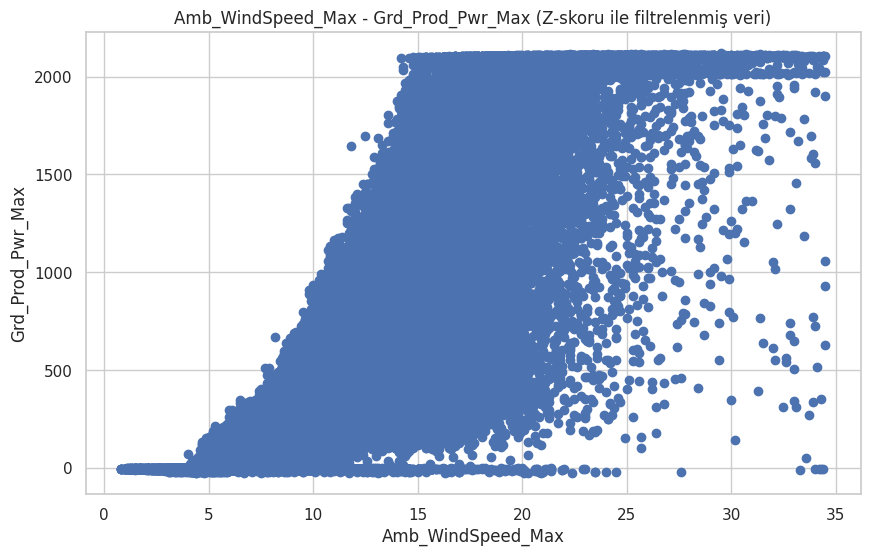

In [1003]:
# prompt: Z-skoru ile filtrelenmiş veri nin Amb_WindSpeed_Max -Grd_Prod_Pwr_Max grafiğini çiz

plt.figure(figsize=(10, 6))
plt.scatter(filtered_data_iqr['Amb_WindSpeed_Max'], filtered_data_iqr['Grd_Prod_Pwr_Max'])
plt.xlabel('Amb_WindSpeed_Max')
plt.ylabel('Grd_Prod_Pwr_Max')
plt.title('Amb_WindSpeed_Max - Grd_Prod_Pwr_Max (Z-skoru ile filtrelenmiş veri)')
plt.show()

In [1004]:
# prompt: (filtered_data_iqr['Amb_WindSpeed_Max'], filtered_data_iqr['Grd_Prod_Pwr_Max'] plotly ile çiz

fig = px.scatter(filtered_data_iqr, x='Amb_WindSpeed_Max', y='Grd_Prod_Pwr_Max',
                 title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max (IQR ile filtrelenmiş veri)')
fig.show()

In [1005]:
# prompt: 'Teorik Güç Eğrisi2 ve 'Teorik Güç Eğrisi fonksiyon şeklinde tanımla

def TeorikGucEgrisi(ruzgar_hizlari):
  # Sabitler
  rho = 1.225  # Hava yoğunluğu (kg/m^3)
  D = 2  # Türbin çapı (m)
  A = 1  # Kesit alanı (m^2)

  # Güç hesaplama
  guc = np.zeros_like(ruzgar_hizlari)

  # Rüzgar hızı aralığında güç hesaplama
  for i, v in enumerate(ruzgar_hizlari):
      if v >= 3 and v <= 15:  # Cut-in ve cut-off arası
          guc[i] = 0.5 * rho * A * v ** 3
      elif v > 15 and v <= 25:
          guc[i] = 2100 # Hız 15-25 arası olduğunda güç 2000 de sabit
  return guc


def TeorikGucEgrisi2(ruzgar_hizlari):
  # Sabitler
  rho = 1.225  # Hava yoğunluğu (kg/m^3)
  D = 2  # Türbin çapı (m)
  A = 1  # Kesit alanı (m^2)

  # Kaydırma miktarı
  kaydirma_miktari = 2

  # Rüzgar hızlarını kaydır
  ruzgar_hizlari_kaydir = ruzgar_hizlari + kaydirma_miktari

  # Güç hesaplama
  guc = np.zeros_like(ruzgar_hizlari)

  # Rüzgar hızı aralığında güç hesaplama
  for i, v in enumerate(ruzgar_hizlari):
      if v >= 3 and v <= 15:  # Cut-in ve cut-off arası
          guc[i] = 0.5 * rho * A * v ** 3
      elif v > 15 and v <= 25:
          guc[i] = 2100 # Hız 15-25 arası olduğunda güç 2000 de sabit
  return guc, ruzgar_hizlari_kaydir

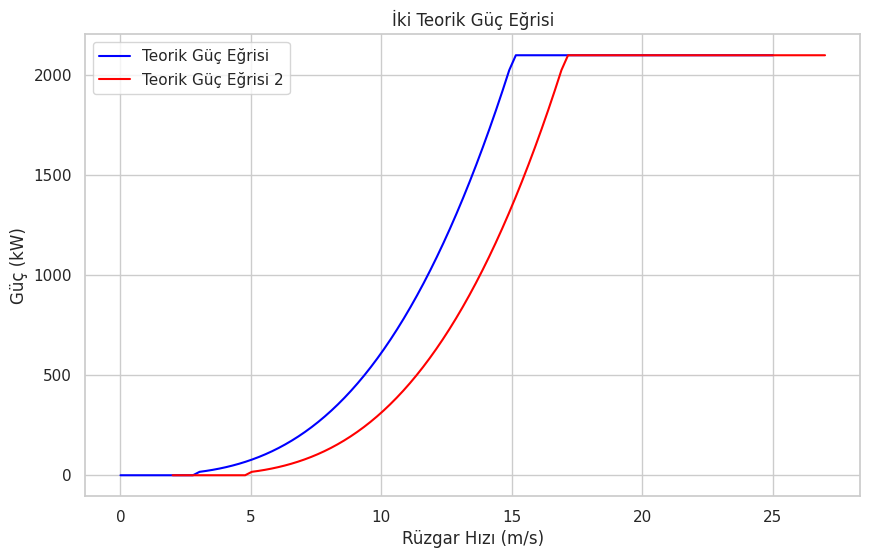

In [1006]:
# prompt: her iki fonskiyonu çiz

plt.figure(figsize=(10, 6))

# TeorikGucEgrisi fonksiyonunu çiz
ruzgar_hizlari = np.linspace(0, 25, 100)
guc = TeorikGucEgrisi(ruzgar_hizlari)
plt.plot(ruzgar_hizlari, guc, label='Teorik Güç Eğrisi', color='blue')

# TeorikGucEgrisi2 fonksiyonunu çiz
guc2, ruzgar_hizlari_kaydir = TeorikGucEgrisi2(ruzgar_hizlari)
plt.plot(ruzgar_hizlari_kaydir, guc2, label='Teorik Güç Eğrisi 2', color='red')

plt.title('İki Teorik Güç Eğrisi')
plt.xlabel('Rüzgar Hızı (m/s)')
plt.ylabel('Güç (kW)')
plt.grid(True)
plt.legend()
plt.show()

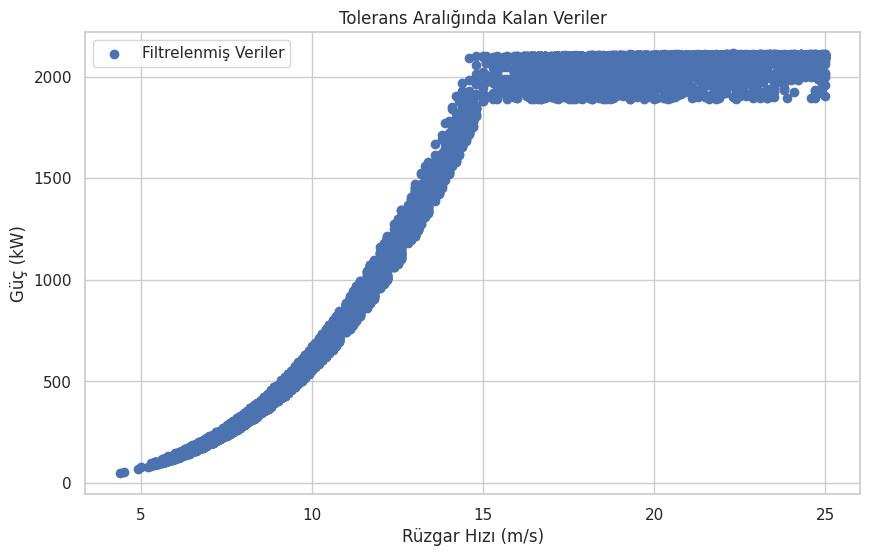

In [1007]:
# prompt: teorik güç eğirisi tolerasn içindeki verileri seç

# Teorik güç eğrisini hesaplamak ve tolerans aralığındaki verileri seçmek için bir fonksiyon tanımlayalım.
def teorik_guc_egrisi_ve_tolerans_filtresi(df, ruzgar_hizi_sutunu, guc_sutunu, tolerans_orani):
  """
  Teorik güç eğrisini hesaplar ve tolerans aralığında kalan verileri döndürür.

  Args:
    df: Verilerin bulunduğu DataFrame.
    ruzgar_hizi_sutunu: Rüzgar hızının sütun adı.
    guc_sutunu: Güç çıkışının sütun adı.
    tolerans_orani: Tolerans oranı (örneğin, 0.10).

  Returns:
    Tolerans aralığında kalan verilerin bulunduğu yeni DataFrame.
  """

  # Teorik güç eğrisini hesaplayın (bu örnekte basit bir eğri kullanılıyor).
  ruzgar_hizlari = df[ruzgar_hizi_sutunu]
  teorik_gucler = TeorikGucEgrisi(ruzgar_hizlari)  # TeorikGucEgrisi fonksiyonunu kullanın

  # Tolerans aralığını hesaplayın.
  tolerans_alt_sinir = teorik_gucler * (1 - tolerans_orani)
  tolerans_ust_sinir = teorik_gucler * (1 + tolerans_orani)

  # Tolerans aralığında kalan verileri seçin.
  filtre = (df[guc_sutunu] >= tolerans_alt_sinir) & (df[guc_sutunu] <= tolerans_ust_sinir)
  filtrelenen_veri = df[filtre]

  return filtrelenen_veri

# Örnek kullanım:
tolerans_orani = 0.10  # %10 tolerans
filtered_df = teorik_guc_egrisi_ve_tolerans_filtresi(filtered_data_iqr, 'Amb_WindSpeed_Max', 'Grd_Prod_Pwr_Max', tolerans_orani)

#

# Filtrelenmiş verileri görselleştirin.
plt.figure(figsize=(10, 6))
plt.scatter(filtrelenen_veri['Amb_WindSpeed_Max'], filtrelenen_veri['Grd_Prod_Pwr_Max'], label='Filtrelenmiş Veriler')
plt.xlabel('Rüzgar Hızı (m/s)')
plt.ylabel('Güç (kW)')
plt.title('Tolerans Aralığında Kalan Veriler')
plt.legend()
plt.grid(True)
plt.show()


In [1008]:
# prompt: filtered_df index değerlerini ddf verisetinden seçerek yeni bir final_df oluştur

# ddf verisetindeki index değerlerini kullanarak final_df oluşturma
final_df = dd.loc[filtrelenen_veri.index]
final_df = pd.concat([final_df, dd[dd['Fault'] != 'NF']])

final_df

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:30:00+00:00,1582.1,1286.5,1450.0,62.5,40,58,59,58,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,37,95.1,NF
2016-12-31 23:50:00+00:00,1676.9,1411.1,1625.1,51.6,41,61,62,62,25,55,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,102.4,NF


In [1009]:
# prompt: final_df'ye ddf nin 2016-03-01 ile 2016-03-03 tarihleri arasındaki verileri ekle

# 2016-03-01 ile 2016-03-03 tarihleri arasındaki verileri ddf'den seç
#start_date = '2016-03-01'
#end_date = '2016-03-03'
#dd_subset = dd[(dd.index >= start_date) & (dd.index <= end_date)]

# final_df'ye bu verileri ekle
#final_df = pd.concat([final_df, dd_subset])

In [1010]:
# prompt: index dıplikelerini sil

# Index duplikalarını silmek için:
final_df = final_df[~final_df.index.duplicated(keep='first')]

In [1011]:
final_df

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:30:00+00:00,1582.1,1286.5,1450.0,62.5,40,58,59,58,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,37,95.1,NF
2016-12-31 23:50:00+00:00,1676.9,1411.1,1625.1,51.6,41,61,62,62,25,55,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,102.4,NF


In [1012]:
ddf=final_df.copy()

In [1013]:
# prompt: max wind speed > 15 ve max power output< 3000 olan NF verilerini temizle
ddf = ddf.drop(ddf[(ddf['Amb_WindSpeed_Max'] > 25) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['Grd_Prod_Pwr_Max'] <= 0) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['Grd_Prod_Pwr_Max'] > 2200) & (ddf.iloc[:, -1] == 'NF')].index)


In [1014]:
ddf

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:30:00+00:00,1582.1,1286.5,1450.0,62.5,40,58,59,58,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,37,95.1,NF
2016-12-31 23:50:00+00:00,1676.9,1411.1,1625.1,51.6,41,61,62,62,25,55,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,102.4,NF


In [1015]:
# prompt: ddf max power max rüzgar hızı grafiğini plotly kullanarak çiz

import plotly.express as px

fig = px.scatter(ddf, x="Amb_WindSpeed_Max", y="Grd_Prod_Pwr_Max", color="Fault", title="Max Power vs Max Wind Speed")
fig.show()


In [1016]:
ddf

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:30:00+00:00,1582.1,1286.5,1450.0,62.5,40,58,59,58,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,37,95.1,NF
2016-12-31 23:50:00+00:00,1676.9,1411.1,1625.1,51.6,41,61,62,62,25,55,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,102.4,NF


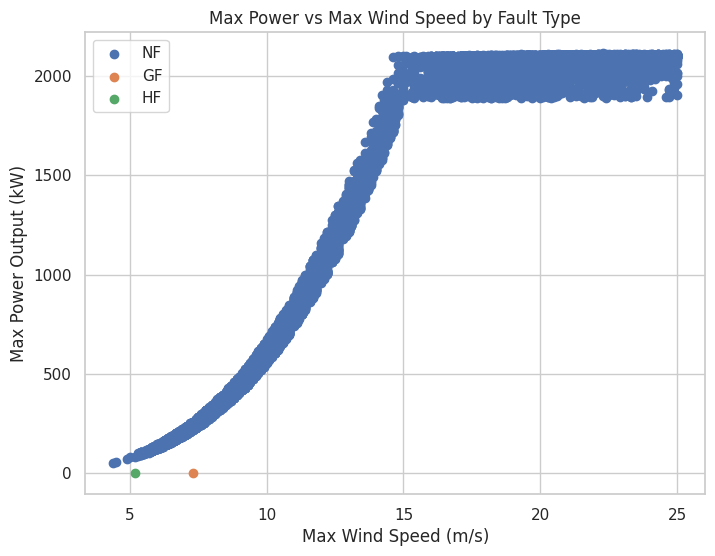

In [1017]:
# prompt: ddf max power-max wind speed grafiğini arıza türlerine göre çiz

plt.figure(figsize=(8, 6))
for fault in ddf['Fault'].unique():
  subset = ddf[ddf['Fault'] == fault]
  plt.scatter(subset['Amb_WindSpeed_Max'], subset['Grd_Prod_Pwr_Max'], label=fault)

plt.xlabel('Max Wind Speed (m/s)')
plt.ylabel('Max Power Output (kW)')
plt.title('Max Power vs Max Wind Speed by Fault Type')
plt.legend()
plt.grid(True)
plt.show()


In [1018]:
data=ddf.copy()
#data=dd    # filtresiz

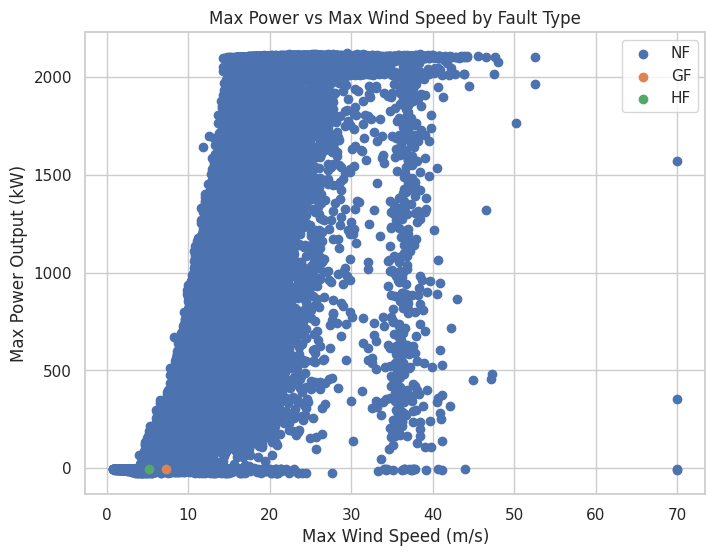

In [1019]:

plt.figure(figsize=(8, 6))
for fault in dd['Fault'].unique():
  subset = dd[dd['Fault'] == fault]
  plt.scatter(subset['Amb_WindSpeed_Max'], subset['Grd_Prod_Pwr_Max'], label=fault)

plt.xlabel('Max Wind Speed (m/s)')
plt.ylabel('Max Power Output (kW)')
plt.title('Max Power vs Max Wind Speed by Fault Type')
plt.legend()
plt.grid(True)
plt.show()

In [1020]:
data = data[data['Fault'].isin([fau, 'NF'])]


In [1021]:
# Calculate the count of each fault class
fault_counts = data['Fault'].value_counts()

# Print the counts
print(fault_counts)


Fault
NF    11146
GF        1
Name: count, dtype: int64


data_n1 = data[(data['DateTime_x'] >= '2014-05-10') & (data['DateTime_x'] <= '2014-05-14 14:30:00	')]
data_n2 = data[(data['DateTime_x'] >= '2014-10-13') & (data['DateTime_x'] <= '2014-10-17 11:30:00	')]
data_n3 = data[(data['DateTime_x'] >= '2014-10-22') & (data['DateTime_x'] <= '2014-10-26 18:00:00	')]
data_n4 = data[(data['DateTime_x'] >= '2015-01-03') & (data['DateTime_x'] <= '2015-01-07 18:00:00	')]

In [1022]:
#data = data.drop('WEC: Production kWh', axis=1)
#data=data.drop('WEC: min. Power',axis=1)
#data=data.drop('WEC: ava. available P from wind',axis=1)
#data=data.drop('RTU: ava. Setpoint 1',axis=1)
#data_nf = data[data.Fault == 'NF'].sample(40000, random_state = 123)
data_nf=data[data.Fault == 'NF']
data_allF = data[data.Fault != 'NF']


In [1023]:
data=data.sort_index()

In [1024]:
data

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF


In [1025]:
#data=data.set_index('DateTime_x')
data=data.sort_index()
data

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,NF
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,NF
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,NF
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,NF
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,NF


In [1026]:

data_af=data
data_af = data_af.sort_index()
hdata=data_af['Fault'].replace('NF', 0, inplace=True)
hdata=data_af['Fault'].replace(fau, 1, inplace=True)


In [1027]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,0
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,0
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [1028]:
# prompt: 2014-11-28 16:30:00 tarihinden sonraki satırları temizle

#data_af = data_af[data_af.index <= '2015-01-11 09:00:00']


In [1029]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,0
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,0
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [1030]:
# prompt: duplikeleri sil

data_af = data_af[~data_af.index.duplicated(keep='first')]


In [1031]:
data_af

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,Fault
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1339.4,1233.3,1270.9,18.8,42,59,61,60,30,48,...,-752.6,-1000.0,56.5,973.4,1000.0,752.6,56.5,38,206.9,0
2016-01-01 01:10:00+00:00,1293.3,1235.6,1257.1,10.9,44,61,62,61,30,49,...,-413.6,-1000.0,122.8,939.3,1000.0,413.6,122.8,39,206.9,0
2016-01-01 01:30:00+00:00,1277.1,1232.0,1255.4,8.0,43,60,62,61,30,49,...,-473.7,-1000.0,141.7,828.6,1000.0,473.7,141.7,39,215.7,0
2016-01-01 01:50:00+00:00,1267.7,1230.2,1248.9,6.4,43,60,62,61,30,48,...,0.0,-767.3,182.5,260.1,767.3,0.0,182.5,38,199.9,0
2016-01-01 06:50:00+00:00,1357.7,1242.6,1289.9,20.3,34,47,48,48,29,45,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,32,212.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1571.8,1354.4,1450.3,43.7,41,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 21:40:00+00:00,1613.9,1331.2,1498.2,65.1,40,58,59,58,27,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0
2016-12-31 22:20:00+00:00,1592.3,1330.5,1476.5,57.8,40,58,59,59,26,53,...,-1000.0,-1000.0,0.0,1000.0,1000.0,1000.0,0.0,38,95.1,0


In [1032]:
data_afx= data_af.drop(columns=['Fault'])
data_afy=data_af['Fault']

In [1033]:
data_afy

,Fault
Timestamp,
2016-01-01 00:00:00+00:00,0
2016-01-01 01:10:00+00:00,0
2016-01-01 01:30:00+00:00,0
2016-01-01 01:50:00+00:00,0
2016-01-01 06:50:00+00:00,0
...,...
2016-12-31 21:30:00+00:00,0
2016-12-31 21:40:00+00:00,0
2016-12-31 22:20:00+00:00,0


In [1034]:
scaler1 = preprocessing.MinMaxScaler()

x_new = pd.DataFrame(scaler1.fit_transform(data_afx),
                              columns = data_afx.columns,
                              index = data_afx.index)

In [1035]:
x_new

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Avg,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,0.142692,0.742013,0.733957,0.023184,0.298507,0.326733,0.35,0.34,0.25000,0.566667,...,0.0266,0.2474,0.0000,0.115471,0.9734,1.0000,0.7526,0.115471,0.30,0.574188
2016-01-01 01:10:00+00:00,0.066380,0.743397,0.725048,0.012597,0.328358,0.346535,0.36,0.35,0.25000,0.600000,...,0.0607,0.5864,0.0000,0.250971,0.9393,1.0000,0.4136,0.250971,0.32,0.574188
2016-01-01 01:30:00+00:00,0.039563,0.741231,0.723951,0.008711,0.313433,0.336634,0.36,0.35,0.25000,0.600000,...,0.1714,0.5263,0.0000,0.289597,0.8286,1.0000,0.4737,0.289597,0.32,0.598824
2016-01-01 01:50:00+00:00,0.024003,0.740148,0.719755,0.006567,0.313433,0.336634,0.36,0.35,0.25000,0.566667,...,0.7399,1.0000,0.2327,0.372982,0.2601,0.7673,0.0000,0.372982,0.30,0.554591
2016-01-01 06:50:00+00:00,0.172985,0.747608,0.746223,0.025194,0.179104,0.207921,0.22,0.22,0.21875,0.466667,...,0.0000,0.0000,0.0000,0.000000,1.0000,1.0000,1.0000,0.000000,0.18,0.589866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,0.527396,0.814873,0.849774,0.056553,0.283582,0.316832,0.33,0.32,0.15625,0.733333,...,0.0000,0.0000,0.0000,0.000000,1.0000,1.0000,1.0000,0.000000,0.30,0.261198
2016-12-31 21:40:00+00:00,0.597087,0.800915,0.880697,0.085232,0.268657,0.316832,0.33,0.32,0.15625,0.733333,...,0.0000,0.0000,0.0000,0.000000,1.0000,1.0000,1.0000,0.000000,0.30,0.261198
2016-12-31 22:20:00+00:00,0.561331,0.800493,0.866688,0.075449,0.268657,0.316832,0.33,0.33,0.12500,0.733333,...,0.0000,0.0000,0.0000,0.000000,1.0000,1.0000,1.0000,0.000000,0.30,0.261198


In [1036]:
# prompt: Xgboost ile feature selection uygulka

import xgboost as xgb

# Create an XGBClassifier object
model = xgb.XGBClassifier()


# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_xgb = feature_importances['feature'][:15]


                        feature  importance
76        Grd_Prod_PsbleCap_Max    0.073705
56        Grd_Prod_CurPhse3_Avg    0.073602
9             Gear_Oil_Temp_Avg    0.072598
65        Grd_Prod_ReactPwr_Min    0.072280
33  Grd_InverterPhase1_Temp_Avg    0.070792
73        Grd_Prod_PsbleInd_Min    0.070215
30      HVTrafo_Phase1_Temp_Avg    0.070084
7           Gen_Phase3_Temp_Avg    0.068921
63        Grd_Prod_ReactPwr_Avg    0.064774
42          Blds_PitchAngle_Std    0.058397
31      HVTrafo_Phase2_Temp_Avg    0.054616
19     Amb_WindDir_Relative_Avg    0.047564
71        Grd_Prod_PsbleInd_Avg    0.046003
2                   Gen_RPM_Avg    0.039797
69        Grd_Prod_PsblePwr_Min    0.034564


In [1037]:
# Ensure x_new and data_afy have the same number of rows
x_new = x_new.loc[data_afy.index]  # Select rows from x_new that match the index of data_afy

# Convert data_afy to a consistent data type (e.g., all integers)
data_afy = pd.to_numeric(data_afy, errors='coerce') # 'coerce' will replace invalid values with NaN

# If you have NaN values after conversion, handle them (e.g., drop rows or impute values)
# For this example, let's drop rows with NaNs
data_afy = data_afy.dropna()
x_new = x_new.loc[data_afy.index]  # Update x_new again after dropping NaNs from data_afy

# Create an XGBClassifier object
model = xgb.XGBClassifier()

# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_xgb = feature_importances['feature'][:15]

                        feature  importance
76        Grd_Prod_PsbleCap_Max    0.073705
56        Grd_Prod_CurPhse3_Avg    0.073602
9             Gear_Oil_Temp_Avg    0.072598
65        Grd_Prod_ReactPwr_Min    0.072280
33  Grd_InverterPhase1_Temp_Avg    0.070792
73        Grd_Prod_PsbleInd_Min    0.070215
30      HVTrafo_Phase1_Temp_Avg    0.070084
7           Gen_Phase3_Temp_Avg    0.068921
63        Grd_Prod_ReactPwr_Avg    0.064774
42          Blds_PitchAngle_Std    0.058397
31      HVTrafo_Phase2_Temp_Avg    0.054616
19     Amb_WindDir_Relative_Avg    0.047564
71        Grd_Prod_PsbleInd_Avg    0.046003
2                   Gen_RPM_Avg    0.039797
69        Grd_Prod_PsblePwr_Min    0.034564


In [1038]:
# prompt: feature selection threshold 0.02 nin altındakileri çıkart

# Filter features with importance greater than 0.02
selected_features_xgb = feature_importances[feature_importances['importance'] > 0.05]['feature']
dim=len(selected_features_xgb)
dim

11

In [1039]:
# prompt: kaç adet olduğunu belirle

len(selected_features_xgb)


11

In [1040]:
# prompt: Dense-Net kullanarak feature selection yap
'''

from keras.layers import Dense
from keras.models import Sequential
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)

# Define the Dense-Net model
model = Sequential()
model.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print('Test accuracy:', accuracy)

# Get the feature importances from the trained model
importances = model.layers[0].get_weights()[0]
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_dense = feature_importances['feature'][:15]

'''

"\n\nfrom keras.layers import Dense\nfrom keras.models import Sequential\nfrom sklearn.model_selection import train_test_split\n\n# Split the data into training and testing sets\nX_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)\n\n# Define the Dense-Net model\nmodel = Sequential()\nmodel.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))\nmodel.add(Dense(32, activation='relu'))\nmodel.add(Dense(1, activation='sigmoid'))\n\n# Compile the model\nmodel.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])\n\n# Train the model\nmodel.fit(X_train, y_train, epochs=20, batch_size=32)\n\n# Evaluate the model\nloss, accuracy = model.evaluate(X_test, y_test)\nprint('Test accuracy:', accuracy)\n\n# Get the feature importances from the trained model\nimportances = model.layers[0].get_weights()[0]\nfeature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})\

In [1041]:
my_dict = {}
my_list = selected_features_xgb          #kbest             common_selected               #my_list = selectlist
my_tuple = tuple(my_list)
my_dict[my_tuple] = "value"
my_tuple

('Grd_Prod_PsbleCap_Max',
 'Grd_Prod_CurPhse3_Avg',
 'Gear_Oil_Temp_Avg',
 'Grd_Prod_ReactPwr_Min',
 'Grd_InverterPhase1_Temp_Avg',
 'Grd_Prod_PsbleInd_Min',
 'HVTrafo_Phase1_Temp_Avg',
 'Gen_Phase3_Temp_Avg',
 'Grd_Prod_ReactPwr_Avg',
 'Blds_PitchAngle_Std',
 'HVTrafo_Phase2_Temp_Avg')

In [1042]:
my_list

,feature
76,Grd_Prod_PsbleCap_Max
56,Grd_Prod_CurPhse3_Avg
9,Gear_Oil_Temp_Avg
65,Grd_Prod_ReactPwr_Min
33,Grd_InverterPhase1_Temp_Avg
73,Grd_Prod_PsbleInd_Min
30,HVTrafo_Phase1_Temp_Avg
7,Gen_Phase3_Temp_Avg
63,Grd_Prod_ReactPwr_Avg
42,Blds_PitchAngle_Std


In [1043]:
x_new = x_new.reindex(columns = my_tuple)
x_new['Fault']=data_af['Fault']
data_af=x_new
corr_matrixx = data_af.corr()
corr_matrixx['Fault'].sort_values(ascending=False)

,Fault
Fault,1.000000
Grd_Prod_PsbleInd_Min,0.155367
Blds_PitchAngle_Std,0.033216
Grd_Prod_ReactPwr_Avg,0.028804
Grd_Prod_ReactPwr_Min,0.018365
Grd_Prod_CurPhse3_Avg,-0.018372
HVTrafo_Phase2_Temp_Avg,-0.020645
HVTrafo_Phase1_Temp_Avg,-0.021407
Gen_Phase3_Temp_Avg,-0.022946
Grd_InverterPhase1_Temp_Avg,-0.029141


In [1044]:
data_af

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1.0000,0.125899,0.566667,0.900360,0.379310,0.0000,0.171875,0.34,0.486126,0.006711,0.157895,0
2016-01-01 01:10:00+00:00,1.0000,0.108712,0.600000,0.913265,0.379310,0.0000,0.187500,0.35,0.492025,0.006711,0.171053,0
2016-01-01 01:30:00+00:00,1.0000,0.090990,0.600000,0.900260,0.344828,0.0000,0.187500,0.35,0.485252,0.006711,0.171053,0
2016-01-01 01:50:00+00:00,0.7673,0.037585,0.566667,0.887355,0.310345,0.2327,0.171875,0.35,0.519773,0.013423,0.171053,0
2016-01-01 06:50:00+00:00,1.0000,0.161166,0.466667,0.903962,0.379310,0.0000,0.140625,0.22,0.475421,0.006711,0.131579,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1.0000,0.264645,0.733333,0.885354,0.344828,0.0000,0.281250,0.32,0.424295,0.002237,0.263158,0
2016-12-31 21:40:00+00:00,1.0000,0.318585,0.733333,0.883854,0.344828,0.0000,0.265625,0.32,0.424077,0.002237,0.263158,0
2016-12-31 22:20:00+00:00,1.0000,0.300684,0.733333,0.878251,0.344828,0.0000,0.265625,0.33,0.414245,0.002237,0.263158,0


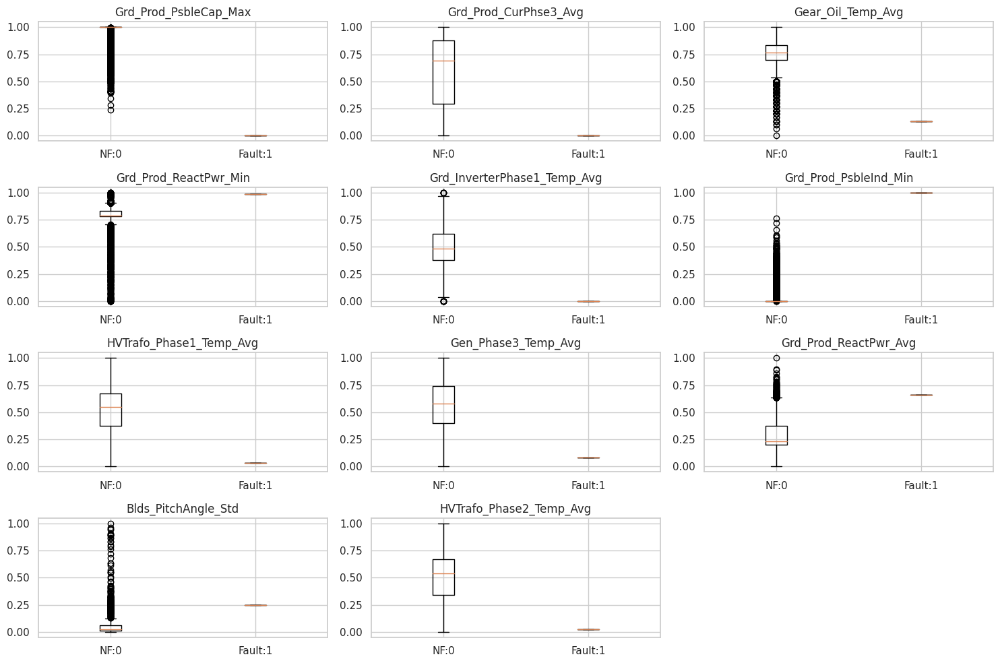

In [1045]:
features = selected_features_xgb
ddf=data_af.copy()

# Filter the data for NF and EF
data_nf = ddf[ddf['Fault'] == 0][features]
data_ef = ddf[ddf['Fault'] == 1][features]

# Create box plots for each feature
plt.figure(figsize=(15, 10))

# Calculate the number of rows and columns for subplots
num_rows = int(len(features) / 3) + (len(features) % 3 > 0)  # Calculate the number of rows needed

for i, feature in enumerate(features):
  plt.subplot(num_rows, 3, i + 1) # Use num_rows to create enough subplots
  plt.boxplot([data_nf[feature], data_ef[feature]], labels=['NF:0', 'Fault:1'])
  plt.title(feature)

plt.tight_layout()
plt.show()

In [1046]:
# prompt: data_nf remove outliers

# Sadece NF verilerini al
nf_data = data_af[data_af['Fault'] == 0]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in nf_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if nf_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = nf_data[column].quantile(0.25)
    Q3 = nf_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    nf_data = nf_data[(nf_data[column] >= lower_bound) & (nf_data[column] <= upper_bound)]


# Temizlenmiş NF verilerini ddf'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 0], nf_data]) # Changed append to concat

data_af=data_af.sort_index()


In [1047]:
# prompt: remove ef_data outliers

# Sadece EF verilerini al
ef_data = data_af[data_af['Fault'] == 1]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in ef_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if ef_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = ef_data[column].quantile(0.25)
    Q3 = ef_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    ef_data = ef_data[(ef_data[column] >= lower_bound) & (ef_data[column] <= upper_bound)]


# Temizlenmiş EF verilerini data_af'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 1], ef_data]) # Changed append to concat

data_af=data_af.sort_index()


In [1048]:
data_af[data_af['Fault'] != 0]

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-03-03 19:20:00+00:00,0.0,0.0,0.133333,0.985294,0.0,1.0,0.03125,0.08,0.659165,0.248322,0.026316,1


In [1049]:
# prompt: 2014-12-09 01:49:00	tarihinden itibaren test verisi olsun

test_date = '2016-02-08T23:00:00+00:00'

trainhy = data_af[data_af.index < test_date]
testhy = data_af[data_af.index >= test_date]




In [1050]:
#percent = round(len(data_af) - len(data_af)*perc)
#trainhy = data_af.iloc[ :percent, :]

#testhy= data_af.iloc[percent: ,:]

In [1051]:
testhy

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-02-09 14:00:00+00:00,1.0,0.666072,0.766667,0.817827,0.379310,0.0,0.328125,0.42,0.291020,0.008949,0.328947,0
2016-02-09 14:10:00+00:00,1.0,0.642284,0.800000,0.809424,0.448276,0.0,0.390625,0.44,0.275726,0.013423,0.381579,0
2016-02-09 14:20:00+00:00,1.0,0.583467,0.833333,0.815326,0.379310,0.0,0.437500,0.45,0.272668,0.011186,0.421053,0
2016-02-09 14:40:00+00:00,1.0,0.491466,0.866667,0.800120,0.379310,0.0,0.453125,0.44,0.251912,0.011186,0.434211,0
2016-02-09 14:50:00+00:00,1.0,0.762058,0.866667,0.800020,0.448276,0.0,0.484375,0.46,0.251912,0.015660,0.460526,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1.0,0.264645,0.733333,0.885354,0.344828,0.0,0.281250,0.32,0.424295,0.002237,0.263158,0
2016-12-31 21:40:00+00:00,1.0,0.318585,0.733333,0.883854,0.344828,0.0,0.265625,0.32,0.424077,0.002237,0.263158,0
2016-12-31 22:20:00+00:00,1.0,0.300684,0.733333,0.878251,0.344828,0.0,0.265625,0.33,0.414245,0.002237,0.263158,0


In [1052]:
# prompt: testhy fault 1 olanları göster

testhy[testhy['Fault'] == 1]


,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-03-03 19:20:00+00:00,0.0,0.0,0.133333,0.985294,0.0,1.0,0.03125,0.08,0.659165,0.248322,0.026316,1


In [1053]:
testhy

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-02-09 14:00:00+00:00,1.0,0.666072,0.766667,0.817827,0.379310,0.0,0.328125,0.42,0.291020,0.008949,0.328947,0
2016-02-09 14:10:00+00:00,1.0,0.642284,0.800000,0.809424,0.448276,0.0,0.390625,0.44,0.275726,0.013423,0.381579,0
2016-02-09 14:20:00+00:00,1.0,0.583467,0.833333,0.815326,0.379310,0.0,0.437500,0.45,0.272668,0.011186,0.421053,0
2016-02-09 14:40:00+00:00,1.0,0.491466,0.866667,0.800120,0.379310,0.0,0.453125,0.44,0.251912,0.011186,0.434211,0
2016-02-09 14:50:00+00:00,1.0,0.762058,0.866667,0.800020,0.448276,0.0,0.484375,0.46,0.251912,0.015660,0.460526,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1.0,0.264645,0.733333,0.885354,0.344828,0.0,0.281250,0.32,0.424295,0.002237,0.263158,0
2016-12-31 21:40:00+00:00,1.0,0.318585,0.733333,0.883854,0.344828,0.0,0.265625,0.32,0.424077,0.002237,0.263158,0
2016-12-31 22:20:00+00:00,1.0,0.300684,0.733333,0.878251,0.344828,0.0,0.265625,0.33,0.414245,0.002237,0.263158,0


In [1054]:
scaler = preprocessing.MinMaxScaler()

train=trainhy.drop(columns=['Fault'])
test=testhy.drop(columns=['Fault'])
X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)

In [1055]:
test

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg
Timestamp,,,,,,,,,,,
2016-02-09 14:00:00+00:00,1.0,0.666072,0.766667,0.817827,0.379310,0.0,0.328125,0.42,0.291020,0.008949,0.328947
2016-02-09 14:10:00+00:00,1.0,0.642284,0.800000,0.809424,0.448276,0.0,0.390625,0.44,0.275726,0.013423,0.381579
2016-02-09 14:20:00+00:00,1.0,0.583467,0.833333,0.815326,0.379310,0.0,0.437500,0.45,0.272668,0.011186,0.421053
2016-02-09 14:40:00+00:00,1.0,0.491466,0.866667,0.800120,0.379310,0.0,0.453125,0.44,0.251912,0.011186,0.434211
2016-02-09 14:50:00+00:00,1.0,0.762058,0.866667,0.800020,0.448276,0.0,0.484375,0.46,0.251912,0.015660,0.460526
...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1.0,0.264645,0.733333,0.885354,0.344828,0.0,0.281250,0.32,0.424295,0.002237,0.263158
2016-12-31 21:40:00+00:00,1.0,0.318585,0.733333,0.883854,0.344828,0.0,0.265625,0.32,0.424077,0.002237,0.263158
2016-12-31 22:20:00+00:00,1.0,0.300684,0.733333,0.878251,0.344828,0.0,0.265625,0.33,0.414245,0.002237,0.263158


In [1056]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0],1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (842, 1, 11)
Test data shape: (8348, 1, 11)


In [1057]:
model4 = Sequential()

model4.add(GRU(16, activation='tanh', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
model4.add(GRU(4, activation='tanh', return_sequences=False))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(GRU(4, activation='tanh', return_sequences=True))
model4.add(GRU(16, activation='tanh', return_sequences=True))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 50
batch_size = 32
history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_57 (GRU)                         │ (None, 1, 16)               │           1,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_58 (GRU)                         │ (None, 4)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ repeat_vector_9 (RepeatVector)       │ (None, 1, 4)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_59 (GRU)                         │ (None, 1, 4)                │             120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_60 (GRU)                         │ (None, 1, 16)               │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 1, 11)               │             187 │
│ (TimeDistributed)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,019 (11.79 KB)

 Trainable params: 3,019 (11.79 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - loss: 0.3920 - val_loss: 0.3587
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.3529 - val_loss: 0.3040
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.2943 - val_loss: 0.2269
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.2158 - val_loss: 0.1557
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1618 - val_loss: 0.1339
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1476 - val_loss: 0.1257
Epoch 7/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1416 - val_loss: 0.1188
Epoch 8/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1336 - val_loss: 0.1096
Epoch 9/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1228 - val_loss: 0.1000
Epoch 10/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1122 - val_loss: 0.0953
Epoch 11/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1069 - val_loss: 0.0920
Epoch 12/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1035 - v

# prompt: aktivasyon fonksiyonu optimizasyonu ya
nb_epochs = 10

# Define a list of activation functions to try
activation_functions = ['relu', 'tanh', 'sigmoid', 'linear', 'silu', 'softmax', 'mish']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: aktivasyon fonksiyonu ile dene
nb_epochs = 50

# Define a list of activation functions to try
activation_functions = ['linear']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: bi directional gru model

from keras.layers import Bidirectional

model4 = Sequential()

model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2]))))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=False)))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=True)))
model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True)))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 30
batch_size = 32
history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


In [ ]:
# prompt: GRU modele CNN spatio temporal yeni model ekle
from keras.layers import Bidirectional
from keras.layers import Conv1D, MaxPooling1D, Flatten, Reshape, Add, concatenate, BatchNormalization, UpSampling1D

def cnn_spatio_temporal_gru_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))

    # CNN Spatio-Temporal Feature Extraction
    x = Conv1D(filters=32, kernel_size=3, activation='linear', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2, padding='same')(x)
    x = Conv1D(filters=64, kernel_size=3, activation='linear', padding='same')(x)
    x = MaxPooling1D(pool_size=2, padding='same')(x)


    # GRU for temporal feature extraction

    x1 = Bidirectional(GRU(16, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x2 = Bidirectional(GRU(16, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x =  concatenate(inputs=[x1, x2]) # Corrected line

    x = GRU(16, activation='linear', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00))(x)


    # Decoder
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=64, kernel_size=3, activation='linear', padding='same')(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=32, kernel_size=3, activation='linear', padding='same')(x)

    output = TimeDistributed(Dense(X.shape[2]))(x)

    model = Model(inputs=inputs, outputs=output)
    return model


model_cnn_gru = cnn_spatio_temporal_gru_model(X_train)
model_cnn_gru.compile(optimizer='adam', loss='mae')
model_cnn_gru.summary()

# Fit the model to the data
history_cnn_gru = model_cnn_gru.fit(X_train, X_train, epochs=50, batch_size=32,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


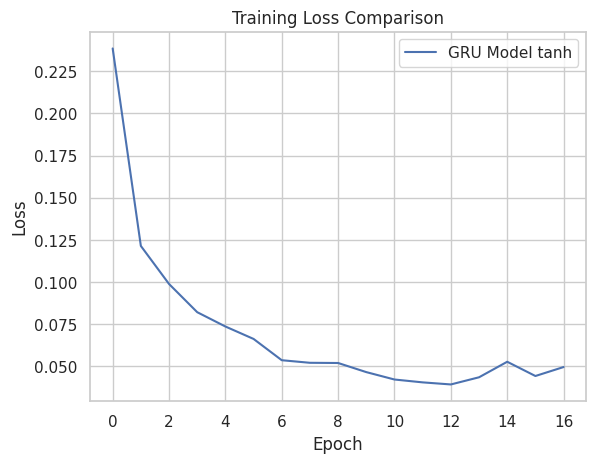

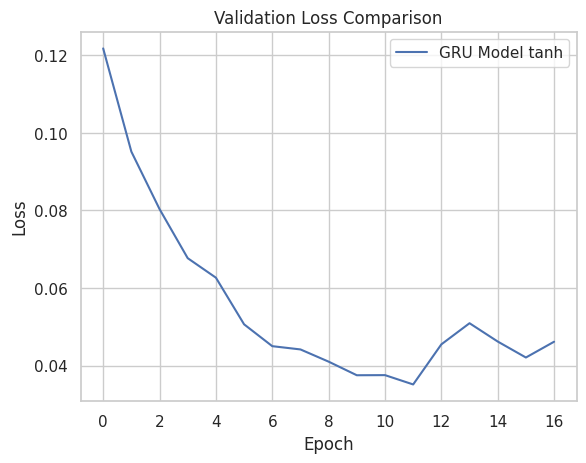

In [1059]:
# Compare the training loss of each model

plt.plot(history_cnn_gru['loss'], label='GRU Model tanh')

plt.title('Training Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Compare the validation loss of each model

plt.plot(history_cnn_gru['val_loss'], label='GRU Model tanh')

plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

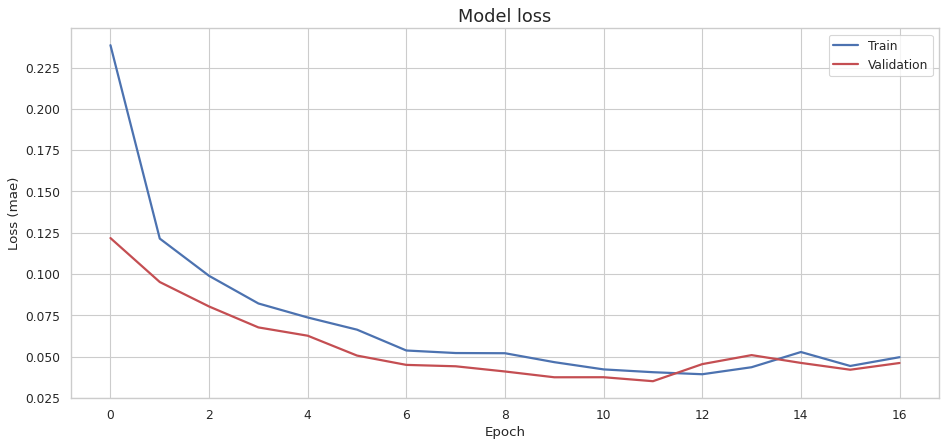

In [1060]:
#history=history4
#model=model4

history=history_cnn_gru
model=model_cnn_gru
# plot the training losses
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)
ax.set_title('Model loss', fontsize=16)
ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')
ax.legend(loc='upper right')
plt.show()

In [1061]:
# prompt: bu model ile prediction yap mae mse rmse mape hesapla
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np

if model == model_cnn_gru:
    X_pred = model.predict(X_test)


    # Reshape to (samples, features) while considering the timesteps
    mae = mean_absolute_error(X_test.reshape(X_test.shape[0], -1),
                              X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions
    mse = mean_squared_error(X_test.reshape(X_test.shape[0], -1),
                              X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(X_test.reshape(X_test.shape[0], -1),
                                        X_pred[:, -1, :].reshape(X_pred.shape[0], -1)) # Use only the last timestep of predictions

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")


261/261 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
MAE: 0.05321608585863812
MSE: 0.005637831270010715
RMSE: 0.07508549307296793
MAPE: 10034804661041.602


In [1062]:
# plot the loss distribution of the training set


X_pred = model.predict(X_train)

if model == model4:
    X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
    X_pred = X_pred[:, -1, :]
    X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)
if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [1063]:
features

,feature
76,Grd_Prod_PsbleCap_Max
56,Grd_Prod_CurPhse3_Avg
9,Gear_Oil_Temp_Avg
65,Grd_Prod_ReactPwr_Min
33,Grd_InverterPhase1_Temp_Avg
73,Grd_Prod_PsbleInd_Min
30,HVTrafo_Phase1_Temp_Avg
7,Gen_Phase3_Temp_Avg
63,Grd_Prod_ReactPwr_Avg
42,Blds_PitchAngle_Std


Otomatik olarak belirlenen eşik değeri: 0.11552365337225289


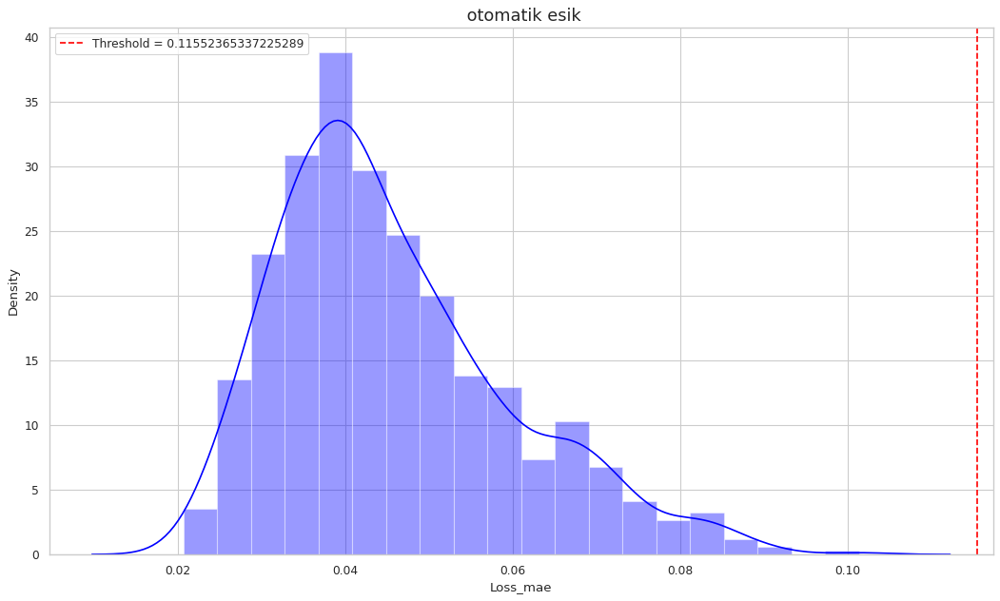

In [1064]:
# Kayıp değerlerini alın
loss_values = scored['Loss_mae'].values

# Kayıp değerlerinin z-skorlarını hesaplayın
z_scores = (loss_values - np.mean(loss_values)) / np.std(loss_values)

# Eşik değeri için bir z-score belirleyin
threshold_z_score = 5 # Örnek olarak, 3.0 z-score'u kullanıyoruz

# Eşik değeri hesaplayın
threshold_value = np.mean(loss_values) + threshold_z_score * np.std(loss_values)

# Eşik değeri görselleştirin
plt.figure(figsize=(16, 9), dpi=80)
plt.title(' otomatik esik', fontsize=16)
sns.distplot(scored['Loss_mae'], bins=20, kde=True, color='blue')
plt.axvline(x=threshold_value, color='red', linestyle='--', label=f'Threshold = {threshold_value}')
plt.legend()


# Eşik değerini ve tespit edilen anomalileri yazdırın
print(f"Otomatik olarak belirlenen eşik değeri: {threshold_value}")

In [1065]:
# plot the loss distribution of the training set


X_pred = model.predict(X_train)
  # Son zaman adımının tahminlerini seçin
if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)
  # X_pred'i 2 boyutlu hale getirin

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)

if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [1066]:
X_pred = model.predict(X_test)

if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

scored= pd.DataFrame(index=test.index)
if model == model4:
  Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
  Xtest = X_test[:, -1, :]
  Xtest = X_test.reshape(X_pred.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest), axis = 1)

261/261 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [1067]:
X_pred

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg
Timestamp,,,,,,,,,,,
2016-02-09 14:00:00+00:00,-0.011238,0.541993,0.561774,0.345363,0.403094,-0.004104,0.339078,0.329031,0.367828,0.083371,0.343357
2016-02-09 14:10:00+00:00,-0.007801,0.570401,0.616232,0.316765,0.442120,-0.000941,0.417871,0.389000,0.330337,0.129384,0.422498
2016-02-09 14:20:00+00:00,-0.005890,0.509114,0.675832,0.327331,0.379849,0.002817,0.466044,0.355003,0.335352,0.062891,0.452609
2016-02-09 14:40:00+00:00,-0.000507,0.471640,0.718662,0.263616,0.337161,0.009074,0.485325,0.349083,0.267108,0.060470,0.468182
2016-02-09 14:50:00+00:00,-0.002765,0.670544,0.770687,0.246682,0.471080,0.007730,0.533466,0.421349,0.260107,0.137092,0.528962
...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,-0.031419,0.138087,0.415877,0.794836,0.275727,-0.020497,0.221927,0.133765,0.798215,-0.055778,0.194174
2016-12-31 21:40:00+00:00,-0.031279,0.175043,0.428312,0.782894,0.291824,-0.020404,0.214364,0.138624,0.790146,-0.047911,0.190082
2016-12-31 22:20:00+00:00,-0.029450,0.175831,0.423859,0.751433,0.286094,-0.019724,0.215540,0.150498,0.758132,-0.043754,0.192881


In [1068]:
Xtest

array([[0.        , 0.65447756, 0.53846154, ..., 0.35477178, 0.08      ,
        0.37735849],
       [0.        , 0.62872594, 0.61538462, ..., 0.30636238, 0.12      ,
        0.45283019],
       [0.        , 0.56505504, 0.69230769, ..., 0.2966805 , 0.1       ,
        0.50943396],
       ...,
       [0.        , 0.2589326 , 0.46153846, ..., 0.74481328, 0.02      ,
        0.28301887],
       [0.        , 0.24489796, 0.46153846, ..., 0.76970954, 0.04      ,
        0.28301887],
       [0.        , 0.41930084, 0.61538462, ..., 0.70193638, 0.02      ,
        0.35849057]])

In [1069]:
# prompt: plotly ile çiz ve threshold çizgisini ve gerçek arıza noktalarını yerleştir

import plotly.graph_objects as go
scored_test=scored.copy()
scored_test['Fault']=testhy['Fault']
# Calculate the exponential moving average (EMA)
window = 50 # Adjust the window size as needed
scored_test['EMA'] = scored_test['Loss_mae'].ewm(span=window, adjust=False).mean()

# Create a figure
fig = go.Figure()

# Add the loss values as a scatter plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['Loss_mae'],
    mode='lines',
    name='Loss'
))

# Add the EMA as a line plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['EMA'],
    mode='lines',
    name='EMA'
))

# Add the threshold line
fig.add_shape(
    type="line",
    x0=scored_test.index.min(),
    x1=scored_test.index.max(),
    y0=threshold_value,
    y1=threshold_value,
    line=dict(
        color="red",
        dash="dash",
    )
)

# Add the actual fault points
fault_indices = testhy[testhy['Fault'] == 1].index
fig.add_trace(go.Scatter(
    x=fault_indices,
    y=scored_test.loc[fault_indices]['Loss_mae'],
    mode='markers',
    name='Actual Faults',
    marker=dict(
        color='green',
        size=8
    )
))

# Set the layout
fig.update_layout(
    title="Test Data Loss over Time with Threshold and Actual Faults",
    xaxis_title="Time",
    yaxis_title="Loss",
    showlegend=True
)

# Display the plot
fig.show()


In [1070]:
# prompt: yukarıdaki modeli kullanarak predicition yap

# Make predictions on the test data

X_pred = model.predict(X_test)

    # Reshape the predictions
if model==model4:
        X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])

else:
        X_pred = X_pred[:, -1, :]
        X_pred = X_pred.reshape(X_pred.shape[0], -1)


    # Convert predictions to a DataFrame
X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

    # Calculate the reconstruction loss
scored = pd.DataFrame(index=test.index)
if model==model4:

   Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
   Xtest = X_test[:, -1, :]
   Xtest = Xtest.reshape(X_test.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtest), axis=1)

    # Add the actual fault values to the scored DataFrame
scored['Fault'] = testhy['Fault']

    # Calculate the EMA (Exponential Moving Average)
window = 50  # Adjust the window size as needed
scored['EMA'] = scored['Loss_mae'].ewm(span=window, adjust=False).mean()

    # Identify anomalies based on the threshold
anomalies = scored[scored['Loss_mae'] > threshold_value]

    # Print the anomalies
print("Anomalies:")
print(anomalies)


261/261 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Anomalies:
                           Loss_mae  Fault       EMA
Timestamp                                           
2016-02-16 10:50:00+00:00  0.145639      0  0.062272
2016-03-03 19:20:00+00:00  0.544669      1  0.071639
2016-07-04 04:20:00+00:00  0.149173      0  0.069575
2016-07-19 13:20:00+00:00  0.130091      0  0.064625
2016-07-19 14:50:00+00:00  0.115665      0  0.068924
2016-07-20 03:30:00+00:00  0.128737      0  0.078715
2016-07-20 09:30:00+00:00  0.139468      0  0.076207
2016-07-24 17:20:00+00:00  0.118874      0  0.068421
2016-07-24 17:30:00+00:00  0.126549      0  0.070701
2016-07-24 18:10:00+00:00  0.123788      0  0.072782
2016-07-24 18:20:00+00:00  0.124951      0  0.074828
2016-07-24 18:50:00+00:00  0.123964      0  0.076755
2016-07-24 19:10:00+00:00  0.119292      0  0.079868
2016-07-24 19:20:00+00:00  0.117588      0  0.081347
2016-07-25 15:10:00+00:00  0.123527      0  0.073843
2016-07-25 16:00:00+00:00  0.124812      0  0.0

In [1071]:
Xtest

array([[0.        , 0.65447756, 0.53846154, ..., 0.35477178, 0.08      ,
        0.37735849],
       [0.        , 0.62872594, 0.61538462, ..., 0.30636238, 0.12      ,
        0.45283019],
       [0.        , 0.56505504, 0.69230769, ..., 0.2966805 , 0.1       ,
        0.50943396],
       ...,
       [0.        , 0.2589326 , 0.46153846, ..., 0.74481328, 0.02      ,
        0.28301887],
       [0.        , 0.24489796, 0.46153846, ..., 0.76970954, 0.04      ,
        0.28301887],
       [0.        , 0.41930084, 0.61538462, ..., 0.70193638, 0.02      ,
        0.35849057]])

In [1072]:
# prompt: feature selection sütunlarını göster
selected_features_xgb

,feature
76,Grd_Prod_PsbleCap_Max
56,Grd_Prod_CurPhse3_Avg
9,Gear_Oil_Temp_Avg
65,Grd_Prod_ReactPwr_Min
33,Grd_InverterPhase1_Temp_Avg
73,Grd_Prod_PsbleInd_Min
30,HVTrafo_Phase1_Temp_Avg
7,Gen_Phase3_Temp_Avg
63,Grd_Prod_ReactPwr_Avg
42,Blds_PitchAngle_Std


In [1073]:
import plotly.graph_objects as go

# Assuming 'scaler1' is the MinMaxScaler object used for scaling
X_pred_original = scaler.inverse_transform(X_pred)
Xtest_original = scaler.inverse_transform(Xtest)

# Create a DataFrame with the original values
X_pred_org = pd.DataFrame(X_pred_original, columns=test.columns, index=test.index)
Xtest_org = pd.DataFrame(Xtest_original, columns=test.columns, index=test.index)

# Select a few features for visualization
features_to_plot = my_tuple

# Create subplots for each selected feature
for feature in features_to_plot:
  fig = go.Figure()

  # Plot X_pred values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=X_pred_org[feature],
      mode='lines',
      name='X_pred',
      line=dict(color='blue')
  ))

  # Plot X_test values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=Xtest_org[feature],  # Use the column name directly to access the values
      mode='lines',
      name='X_test',
      line=dict(color='red')
  ))

      # Add the threshold line
  fig.add_shape(
      type="line",
      x0=scored_test.index.min(),
      x1=scored_test.index.max(),
      y0=threshold_value,
      y1=threshold_value,
      line=dict(
          color="red",
          dash="dash"
  ))

  fig.update_layout(
      title=f"Comparison of {feature} between X_pred and X_test",
      xaxis_title="Time",
      yaxis_title=feature,
      showlegend=True
  )

  fig.show()

In [1074]:
data_af

,Grd_Prod_PsbleCap_Max,Grd_Prod_CurPhse3_Avg,Gear_Oil_Temp_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_PsbleInd_Min,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Grd_Prod_ReactPwr_Avg,Blds_PitchAngle_Std,HVTrafo_Phase2_Temp_Avg,Fault
Timestamp,,,,,,,,,,,,
2016-01-01 00:00:00+00:00,1.0,0.125899,0.566667,0.900360,0.379310,0.0,0.171875,0.34,0.486126,0.006711,0.157895,0
2016-01-01 01:30:00+00:00,1.0,0.090990,0.600000,0.900260,0.344828,0.0,0.187500,0.35,0.485252,0.006711,0.171053,0
2016-01-01 08:00:00+00:00,1.0,0.168124,0.533333,0.885454,0.379310,0.0,0.156250,0.29,0.462093,0.008949,0.144737,0
2016-01-01 08:30:00+00:00,1.0,0.173298,0.533333,0.884454,0.379310,0.0,0.156250,0.31,0.444833,0.006711,0.144737,0
2016-01-01 11:00:00+00:00,1.0,0.172941,0.533333,0.898760,0.379310,0.0,0.156250,0.31,0.467337,0.013423,0.144737,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31 21:30:00+00:00,1.0,0.264645,0.733333,0.885354,0.344828,0.0,0.281250,0.32,0.424295,0.002237,0.263158,0
2016-12-31 21:40:00+00:00,1.0,0.318585,0.733333,0.883854,0.344828,0.0,0.265625,0.32,0.424077,0.002237,0.263158,0
2016-12-31 22:20:00+00:00,1.0,0.300684,0.733333,0.878251,0.344828,0.0,0.265625,0.33,0.414245,0.002237,0.263158,0


In [1075]:
# prompt: Stator temp. 1	için train ve test mae mape rmse mse değerlerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# Assuming X_train and X_test are your training and test data, and X_pred_train and X_pred_test are the corresponding predictions
# Also assuming 'Stator temp. 1' is a column in your DataFrame
X_pred_train = model.predict(X_train)
X_pred_test = model.predict(X_test)


if model == model4:
    X_pred_train = X_pred_train.reshape(X_pred_train.shape[0], X_pred_train.shape[2])
    X_pred_test = X_pred_test.reshape(X_pred_test.shape[0], X_pred_test.shape[2])
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
    Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
    X_pred_train = X_pred_train[:, -1, :]
    X_pred_test = X_pred_test[:, -1, :]
    Xtrain = X_train[:, -1, :]
    Xtest = X_test[:, -1, :]


X_pred_train = pd.DataFrame(X_pred_train, columns=train.columns, index=train.index)
X_pred_test = pd.DataFrame(X_pred_test, columns=test.columns, index=test.index)
Xtrain = pd.DataFrame(Xtrain, columns=train.columns, index=train.index)
Xtest = pd.DataFrame(Xtest, columns=test.columns, index=test.index)


# Calculate MAE, MAPE, RMSE, and MSE for 'Stator temp. 1'
mae_train = mean_absolute_error(Xtrain['Stator temp. 1'], X_pred_train['Stator temp. 1'])
mape_train = mean_absolute_percentage_error(Xtrain['Stator temp. 1'], X_pred_train['Stator temp. 1'])
mse_train = mean_squared_error(Xtrain['Stator temp. 1'], X_pred_train['Stator temp. 1'])
rmse_train = np.sqrt(mse_train)


mae_test = mean_absolute_error(Xtest['Stator temp. 1'], X_pred_test['Stator temp. 1'])
mape_test = mean_absolute_percentage_error(Xtest['Stator temp. 1'], X_pred_test['Stator temp. 1'])
mse_test = mean_squared_error(Xtest['Stator temp. 1'], X_pred_test['Stator temp. 1'])
rmse_test = np.sqrt(mse_test)


print("Train MAE for Stator temp. 1:", mae_train)
print("Train MAPE for Stator temp. 1:", mape_train)
print("Train MSE for Stator temp. 1:", mse_train)
print("Train RMSE for Stator temp. 1:", rmse_train)

print("Test MAE for Stator temp. 1:", mae_test)
print("Test MAPE for Stator temp. 1:", mape_test)
print("Test MSE for Stator temp. 1:", mse_test)
print("Test RMSE for Stator temp. 1:", rmse_test)


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
261/261 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


KeyError: 'Stator temp. 1'

In [ ]:
# prompt: grafiğe dök

import plotly.graph_objects as go

# Assuming you have X_pred_train, Xtrain, X_pred_test, and Xtest DataFrames

# Create a figure
fig = go.Figure()

# Add the training data and predictions
fig.add_trace(go.Scatter(
    x=Xtrain.index,
    y=Xtrain['Stator temp. 1'],
    mode='lines',
    name='Train Data',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=X_pred_train.index,
    y=X_pred_train['Stator temp. 1'],
    mode='lines',
    name='Train Predictions',
    line=dict(color='red')
))

# Add the test data and predictions
fig.add_trace(go.Scatter(
    x=Xtest.index,
    y=Xtest['Stator temp. 1'],
    mode='lines',
    name='Test Data',
    line=dict(color='green')
))

fig.add_trace(go.Scatter(
    x=X_pred_test.index,
    y=X_pred_test['Stator temp. 1'],
    mode='lines',
    name='Test Predictions',
    line=dict(color='orange')
))

# Set the layout
fig.update_layout(
    title="Comparison of Stator Temp. 1 Data and Predictions",
    xaxis_title="Time",
    yaxis_title="Stator temp. 1",
    showlegend=True
)

# Display the plot
fig.show()


In [ ]:
# prompt: grafiğin arka planı beyaz olsu

fig.update_layout(
    plot_bgcolor='white',  # Arka plan rengini beyaz olarak ayarlayın
    xaxis=dict(gridcolor='lightgray'),  # X ekseni ızgara rengini açık gri olarak ayarlayın
    yaxis=dict(gridcolor='lightgray')   # Y ekseni ızgara rengini açık gri olarak ayarlayın
)
fig.show()
